In [ ]:
# mounting drive
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd drive/My Drive

/content/drive/My Drive


In [ ]:
import torch
from torch.nn import functional as F
from torch.nn import (
	Module, Conv2d, ReLU, PReLU, Dropout2d, AvgPool2d,
	Upsample, MaxPool2d, Sequential, MaxUnpool2d,
	BatchNorm2d, AdaptiveAvgPool2d, ConvTranspose2d
)

In [ ]:
class Mish(Module):

	def __init(self):
		super().__init__()
	
	def forward(self, input):
		return input * torch.tanh(F.softplus(input))

In [ ]:
class Activation(Module):
	
	def __init__(self, name='relu'):
		super().__init__()
		self.name = name
		if name == 'relu':
			self.act = ReLU()
		elif name == 'prelu':
			self.act = PReLU()
		elif name == 'mish':
			self.act = Mish()

	def forward(self, input):
		return self.act(input)

### Enet Initial Block

In [ ]:
class InitialBlock(Module):
	
	def __init__(self, in_channels, out_channels, bias=False, activation='relu'):
		super().__init__()
		self.main_branch = Conv2d(
			in_channels, out_channels - 3,
			kernel_size=3, stride=2,
			padding=1, bias=bias
		)
		self.secondary_branch = MaxPool2d(3, stride=2, padding=1)
		self.batch_norm = BatchNorm2d(out_channels)
		self.activation = Activation(activation)

	def forward(self, x):
		main = self.main_branch(x)
		secondary = self.secondary_branch(x)
		output = torch.cat((main, secondary), 1)
		output = self.batch_norm(output)
		output = self.activation(output)
		return output

### Regular Bottleneck Block

In [ ]:
class RegularBottleneckBlock(Module):

	def __init__(
		self, channels, internal_ratio=4, kernel_size=3, padding=0,
		dilation=1, asymmetric=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = channels // internal_ratio
		
		### Main Branch ###
		
		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				channels, internal_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2
		if asymmetric:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(kernel_size, 1), stride=1,
					padding=(padding, 0), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(1, kernel_size), stride=1,
					padding=(0, padding), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		else:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=kernel_size, stride=1,
					padding=padding, dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		
		# Block 3 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(channels),
			Activation(activation),
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	
	def forward(self, x):
		secondary_branch = x
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		main_branch = self.dropout(main_branch)
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

### Downsample Bottleneck Block

In [ ]:
class DownsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels, internal_ratio=4,
		return_indices=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio
		self.return_indices = return_indices

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=2, stride=2, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 3x3
		self.main_conv_block_2 = Sequential(
			Conv2d(
				internal_channels, internal_channels,
				kernel_size=3, stride=1, padding=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_maxpool = MaxPool2d(
			2, stride=2,
			return_indices=return_indices
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x):
		# Main Branch
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		# Secondary Branch
		if self.return_indices:
			secondary_branch, max_indices = self.secondary_maxpool(x)
		else:
			secondary_branch = self.secondary_maxpool(x)
		# Padding
		n, ch_main, h, w = main_branch.size()
		ch_sec = secondary_branch.size()[1]
		padding = torch.zeros(n, ch_main - ch_sec, h, w)
		if secondary_branch.is_cuda:
			padding = padding.cuda()
		# Concatenate
		secondary_branch = torch.cat((secondary_branch, padding), 1)
		output = secondary_branch + main_branch
		output = self.activation(output)
		if self.return_indices:
			return output, max_indices
		else:
			return output

### Upsampling Bottleneck Block


In [ ]:
class UpsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels,
		internal_ratio=4, dropout_prob=0,
		bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_branch_conv_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Transposed Convolution
		self.main_branch_transpose_conv_2 = ConvTranspose2d(
			internal_channels, internal_channels,
			kernel_size=2, stride=2, bias=bias
		)
		self.main_branch_bn_2 = BatchNorm2d(internal_channels)
		self.main_branch_act_2 = Activation(activation)

		# Block 3 Conv 1x1
		self.main_branch_conv_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_conv = Sequential(
			Conv2d(
				in_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels)
		)
		self.secondary_unpool = MaxUnpool2d(kernel_size=2)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x, max_indices, output_size):
		# Main Branch
		main_branch = self.main_branch_conv_1(x)
		main_branch = self.main_branch_transpose_conv_2(main_branch, output_size=output_size)
		main_branch = self.main_branch_bn_2(main_branch)
		main_branch = self.main_branch_act_2(main_branch)
		main_branch = self.main_branch_conv_3(main_branch)
		main_branch = self.dropout(main_branch)
		# Secondary Branch
		secondary_branch = self.secondary_conv(x)
		secondary_branch = self.secondary_unpool(
			secondary_branch, max_indices,
			output_size=output_size
		)
		# Concatenate
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

### Building Enet


|Name|Type|Output Size|
|---	|---	|---	|
|Initial|   	|`16x256x256`|
|-------|-------|-------|
|Bottleneck_1|Downsampling|`64x128x128`|
|RegularBottleneck_1_1|   	|`64x128x128`|
|RegularBottleneck_1_2|   	|`64x128x128`|
|RegularBottleneck_1_3|   	|`64x128x128`|
|RegularBottleneck_1_4|   	|`64x128x128`|
|-------|-------|-------|
|Bottleneck_2|Downsampling|`128x64x64`|
|RegularBottleneck_2_1|   	|`128x64x64`|
|RegularBottleneck_2_2|Dilated 2|`128x64x64`|
|RegularBottleneck_2_3|Asymmetric 5|`128x64x64`|
|RegularBottleneck_2_4|Dilated 4|`128x64x64`|
|RegularBottleneck_2_5|   	|`128x64x64`|
|RegularBottleneck_2_6|Dilated 8|`128x64x64`|
|RegularBottleneck_2_7|Asymmetric 5|`128x64x64`|
|RegularBottleneck_2_8|Dilated 16|`128x64x64`|
|-------|-------|-------|
|RegularBottleneck_3|   	|`128x64x64`|
|RegularBottleneck_3_1|Dilated 2|`128x64x64`|
|RegularBottleneck_3_2|Assymetric 5|`128x64x64`|
|RegularBottleneck_3_3|Dilated 4|`128x64x64`|
|RegularBottleneck_3_4|   	|`128x64x64`|
|RegularBottleneck_3_5|Dilated 8|`128x64x64`|
|RegularBottleneck_3_6|Asymmetric 5|`128x64x64`|
|RegularBottleneck_3_7|Dilated 16|`128x64x64`|
|-------|-------|-------|
|Bottleneck_4|Upsampling|`64x128x128`|
|Bottleneck_4_1|   	|`64x128x128`|
|Bottleneck_4_2|   	|`64x128x128`|
|-------|-------|-------|
|Bottleneck_5|Upsampling|`16x256x256`|
|Bottleneck_5_1|   	|`16x256x256`|
|-------|-------|-------|
|Transposed_Conv|   	|`Cx512x512`|

In [ ]:
class Enet(Module):

	def __init__(self, num_classes, encoder_activation='mish', decoder_activation='relu'):
		
		super().__init__()
		
		# Initial Block
		self.initial_block = InitialBlock(3, 16, activation=encoder_activation)
		
		### Encoding Stages ###

		# Stage 1
		self.down_bottleneck_1 = DownsampleBottleneckBlock(
			16, 64, return_indices=True,
			dropout_prob=0.01, activation=encoder_activation
		)
		self.bottleneck_1_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_3 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_4 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)

		# Stage 2
		self.down_bottleneck_2 = DownsampleBottleneckBlock(
			64, 128, return_indices=True,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_1 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_2 = RegularBottleneckBlock(
			128, dilation=2,
			padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_3 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_4 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_5 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_6 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_7 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_8 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 3
		self.regular_bottleneck_3 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_1 = RegularBottleneckBlock(
			128, dilation=2, padding=2,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_2 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_3 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_4 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_5 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_6 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_7 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 4
		self.upsample_4 = UpsampleBottleneckBlock(
			128, 64, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)

		# Stage 5
		self.upsample_5 = UpsampleBottleneckBlock(
			64, 16, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_5 = RegularBottleneckBlock(
			16, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.transposed_conv = ConvTranspose2d(
			16, num_classes, kernel_size=3,
            stride=2, padding=1, output_padding=1, bias=False
		)

	def forward(self, x):
		# Initial Block
		input_size = x.size()
		x = self.initial_block(x)
		# Stage 1
		input_size_1 = x.size()
		x, max_indices_1 = self.down_bottleneck_1(x)
		x = self.bottleneck_1_1(x)
		x = self.bottleneck_1_2(x)
		x = self.bottleneck_1_3(x)
		x = self.bottleneck_1_4(x)
		# Stage 2
		input_size_2 = x.size()
		x, max_indices_2 = self.down_bottleneck_2(x)
		x = self.bottleneck_2_1(x)
		x = self.bottleneck_2_2(x)
		x = self.bottleneck_2_3(x)
		x = self.bottleneck_2_4(x)
		x = self.bottleneck_2_5(x)
		x = self.bottleneck_2_6(x)
		x = self.bottleneck_2_7(x)
		x = self.bottleneck_2_8(x)
		# Stage 3
		x = self.regular_bottleneck_3(x)
		x = self.bottleneck_3_1(x)
		x = self.bottleneck_3_2(x)
		x = self.bottleneck_3_3(x)
		x = self.bottleneck_3_4(x)
		x = self.bottleneck_3_5(x)
		x = self.bottleneck_3_6(x)
		x = self.bottleneck_3_7(x)
		# Stage 4
		x = self.upsample_4(x, max_indices_2, output_size=input_size_2)
		x = self.bottleneck_4_1(x)
		x = self.bottleneck_4_2(x)
		# Stage 5
		x = self.upsample_5(x, max_indices_1, output_size=input_size_1)
		x = self.bottleneck_5(x)
		x = self.transposed_conv(x)
		return x

In [ ]:
print('GPU:', torch.cuda.get_device_name(0))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
enet = Enet(12, encoder_activation='prelu', decoder_activation='relu')
enet = enet.to(device)
print(enet)

GPU: Tesla T4
Enet(
  (initial_block): InitialBlock(
    (main_branch): Conv2d(3, 13, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (secondary_branch): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (batch_norm): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): Activation(
      (act): PReLU(num_parameters=1)
    )
  )
  (down_bottleneck_1): DownsampleBottleneckBlock(
    (main_conv_block_1): Sequential(
      (0): Conv2d(16, 4, kernel_size=(2, 2), stride=(2, 2), bias=False)
      (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Activation(
        (act): PReLU(num_parameters=1)
      )
    )
    (main_conv_block_2): Sequential(
      (0): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Activation(
        (act): 

In [ ]:
import numpy as np
import torch, os
from glob import glob
from time import time
from tqdm import tqdm
from PIL import Image
from torch.nn import functional as F
from matplotlib import pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, ToPILImage

## Dataset Pipeline

In [ ]:
class CamVidDataset(Dataset):

	def __init__(self, images, labels, height, width):
		self.images = images
		self.labels = labels
		self.height = height
		self.width = width
	
	def __len__(self):
		return len(self.images)
	
	def __getitem__(self, index):
		image_id = self.images[index]
		label_id = self.labels[index]
		# Read Image
		x = Image.open(image_id)
		x = [np.array(x)]
		x = np.stack(x, axis=2)
		x = torch.tensor(x).transpose(0, 2).transpose(1, 3) # Convert to N, C, H, W
		# Read Mask
		y = Image.open(label_id)
		y = [np.array(y)]
		y = torch.tensor(y)
		return x.squeeze(), y.squeeze()

In [ ]:
train_images = sorted(glob('./camvid/train/*'))
train_labels = sorted(glob('./camvid/trainannot/*'))
val_images = sorted(glob('./camvid/val/*'))
val_labels = sorted(glob('./camvid/valannot/*'))
test_images = sorted(glob('./camvid/test/*'))
test_labels = sorted(glob('./camvid/testannot/*'))
batch_size = 10

In [ ]:
train_dataset = CamVidDataset(train_images, train_labels, 512, 512)
val_dataset = CamVidDataset(val_images, val_labels, 512, 512)
test_dataset = CamVidDataset(test_images, test_labels, 512, 512)

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


The `decode_segmap` function accepts an image of shape `(H, W)` and a color dictionary denoting the `BGR` color codes to various objects in order for us to visualize the segmentation Masks.

In [ ]:
def decode_segmap(image, color_dict):
    label_colours = np.array([
		color_dict['obj0'], color_dict['obj1'],
		color_dict['obj2'], color_dict['obj3'],
		color_dict['obj4'], color_dict['obj5'],
		color_dict['obj6'], color_dict['obj7'],
		color_dict['obj8'], color_dict['obj9'],
		color_dict['obj10'], color_dict['obj11']
	]).astype(np.uint8)
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    for l in range(0, 12):
        r[image == l] = label_colours[l, 0]
        g[image == l] = label_colours[l, 1]
        b[image == l] = label_colours[l, 2]
    rgb = np.zeros((image.shape[0], image.shape[1], 3)).astype(np.uint8)
    rgb[:, :, 0] = b
    rgb[:, :, 1] = g
    rgb[:, :, 2] = r
    return rgb

The `predict_rgb` function takes the model(enet), a tensor denoting a single image in the form `(1, C, H, W)` and the color_dict and gives us the visualizable prediction

In [ ]:
def predict_rgb(model, tensor, color_dict):
    with torch.no_grad():
        out = model(tensor.float()).squeeze(0)
    out = out.data.max(0)[1].cpu().numpy()
    return decode_segmap(out, color_dict)

The `color_dict` is a dictionary where each object is mapped to its respective color code.

In [ ]:
color_dict = {
    'obj0' : [255, 0, 0], # Sky
    'obj1' : [0, 51, 204], # Building
    'obj2' : [0, 255, 255], # Posts
    'obj3' : [153, 102, 102], # Road
    'obj4' : [51, 0, 102], # Pavement
    'obj5' : [0, 255, 0], # Trees
    'obj6' : [102, 153, 153], # Signs
    'obj7' : [204, 0, 102], # Fence
    'obj8' : [102, 0, 0], # Car
    'obj9' : [0, 153, 102], # Pedestrian
    'obj10' : [255, 255, 255], # Cyclist
    'obj11' : [0, 0, 0] # bicycles
}

Generating a batch from the train dataloader and visualizing them along with their prediction using an untrained Enet.

In [ ]:
x_batch, y_batch = next(iter(train_loader))
x_batch.shape, y_batch.shape

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


(torch.Size([10, 3, 360, 480]), torch.Size([10, 360, 480]))

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


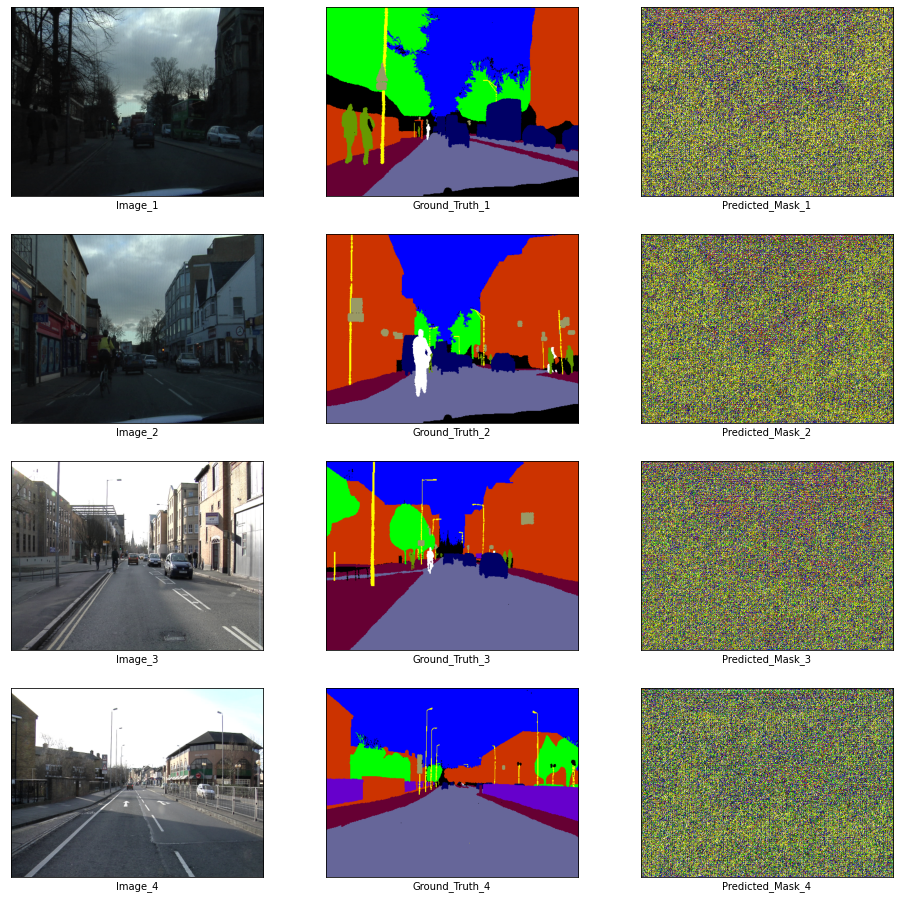

In [ ]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

## Training

In [ ]:
from torch.optim import Adam
from torch.nn import CrossEntropyLoss

In [ ]:
def get_class_weights(loader, num_classes, c=1.02):
    _, y= next(iter(loader))
    y_flat = y.flatten()
    each_class = np.bincount(y_flat, minlength=num_classes)
    p_class = each_class / len(y_flat)
    return 1 / (np.log(c + p_class))

In [ ]:
class_weights = get_class_weights(train_loader, 12)
criterion = CrossEntropyLoss(
    weight=torch.FloatTensor(class_weights).to(device)
)
optimizer = Adam(
    enet.parameters(),
    lr=5e-4,
    weight_decay=2e-4
)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
def train(
	model, train_dataloader, val_dataloader,
	device, criterion, optimizer, train_step_size, val_step_size,
	visualize_every, save_every, save_location, save_prefix, epochs):
	# Make sure that the checkpoint location exists
	try:
		os.mkdir(save_location)
	except:
		pass
	train_loss_history, val_loss_history = [], []
	# Training
	for epoch in range(1, epochs + 1):
		print('Epoch {}\n'.format(epoch))
		# Training
		start = time()
		train_loss = 0
		model.train()
		# Step Loop
		for step in tqdm(range(train_step_size)):
			x_batch, y_batch = next(iter(train_dataloader))
			x_batch = x_batch.squeeze().to(device)
			y_batch = y_batch.squeeze().to(device)
			optimizer.zero_grad()
			out = model(x_batch.float())
			loss = criterion(out, y_batch.long())
			loss.backward()
			optimizer.step()
			train_loss += loss.item()
		train_loss_history.append(train_loss / train_step_size)
		print('\nTraining Loss: {}'.format(train_loss_history[-1]))
		print('Training Time: {} seconds'.format(time() - start))
		# Validation
		val_loss = 0
		model.eval()
		for step in tqdm(range(val_step_size)):
			x_val, y_val = next(iter(val_dataloader))
			x_val = x_val.squeeze().to(device)
			y_val = y_val.squeeze().to(device)
			out = model(x_val.float())
			out = out.data.max(1)[1]
			val_loss += (y_val.long() - out.long()).float().mean()
		val_loss_history.append(val_loss)
		print('\nValidation Loss: {}'.format(val_loss))
		# Visualization
		if epoch % visualize_every == 0:
			x_batch, y_batch = next(iter(train_loader))
			fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
			plt.setp(axes.flat, xticks = [], yticks = [])
			c = 1
			for i, ax in enumerate(axes.flat):
				if i % 3 == 0:
					ax.imshow(ToPILImage()(x_batch[c]))
					ax.set_xlabel('Image_' + str(c))
				elif i % 3 == 1:
					ax.imshow(decode_segmap(y_batch[c], color_dict))
					ax.set_xlabel('Ground_Truth_' + str(c))
				elif i % 3 == 2:
					ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
					ax.set_xlabel('Predicted_Mask_' + str(c))
					c += 1
			plt.show()
		# Checkpoints
		if epoch % save_every == 0:
			checkpoint = {
				'epoch' : epoch,
				'train_loss' : train_loss,
				'val_loss' : val_loss,
				'state_dict' : model.state_dict()
			}
			torch.save(
				checkpoint,
				'{}/{}-{}-{}-{}.pth'.format(
					save_location, save_prefix,
					epoch, train_loss, val_loss
				)
			)
			print('Checkpoint saved')
	print(
        '\nTraining Done.\nTraining Mean Loss: {:6f}\nValidation Mean Loss: {:6f}'.format(
            sum(train_loss_history) / epochs,
            sum(val_loss_history) / epochs
        )
    )
	return train_loss_history, val_loss_history

  0%|          | 0/36 [00:00<?, ?it/s]

Epoch 1



/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4344644637571441
Training Time: 98.68756818771362 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.285587787628174
Epoch 2



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3956192400720384
Training Time: 70.58480858802795 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.834136724472046
Epoch 3



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.40785593125555253
Training Time: 72.34167432785034 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.222163677215576
Epoch 4



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.39875200556384194
Training Time: 71.20083832740784 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.263491153717041
Epoch 5



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.39317092382245594
Training Time: 68.6882073879242 seconds


100%|██████████| 10/10 [00:16<00:00,  1.66s/it]


Validation Loss: -2.490050792694092


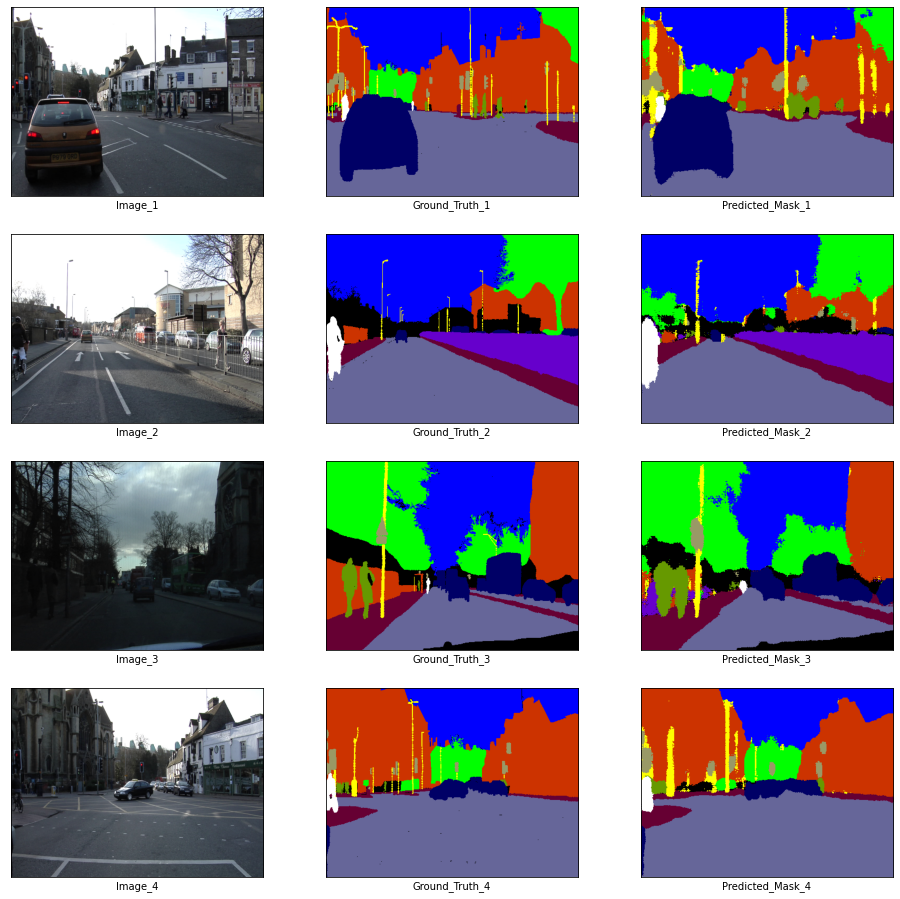

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 6



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3965325802564621
Training Time: 68.8572769165039 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.389688491821289
Epoch 7



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3960813515716129
Training Time: 74.56822061538696 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.209855318069458
Epoch 8



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.399023809366756
Training Time: 71.01653409004211 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.5936532020568848
Epoch 9



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.38959694736533695
Training Time: 71.72912049293518 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.549976110458374
Epoch 10



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3588426303532388
Training Time: 74.87272143363953 seconds


100%|██████████| 10/10 [00:17<00:00,  1.73s/it]


Validation Loss: -2.4899725914001465


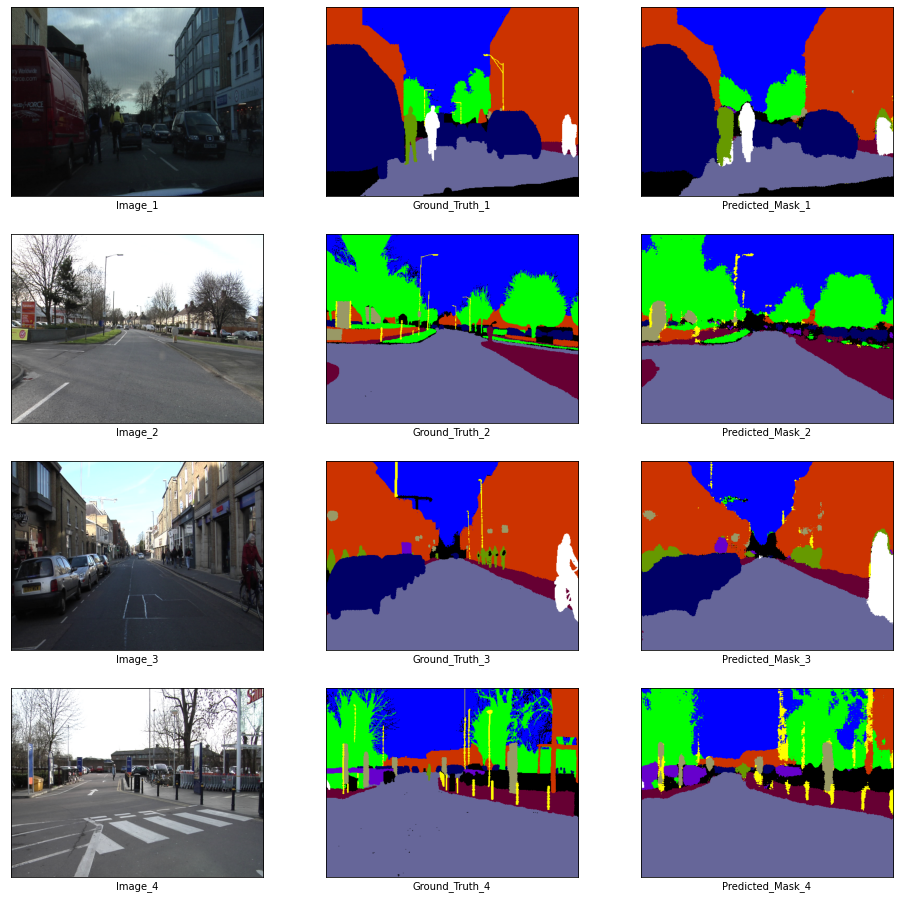

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 11



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.38450106647279525
Training Time: 69.75309777259827 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.269235134124756
Epoch 12



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36741746299796635
Training Time: 72.84524297714233 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.3950328826904297
Epoch 13



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3632950865560108
Training Time: 71.54272174835205 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.427543878555298
Epoch 14



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3585578857196702
Training Time: 73.62234234809875 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.051269054412842
Epoch 15



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36657780077722335
Training Time: 70.2529513835907 seconds


100%|██████████| 10/10 [00:18<00:00,  1.87s/it]


Validation Loss: -2.560940742492676


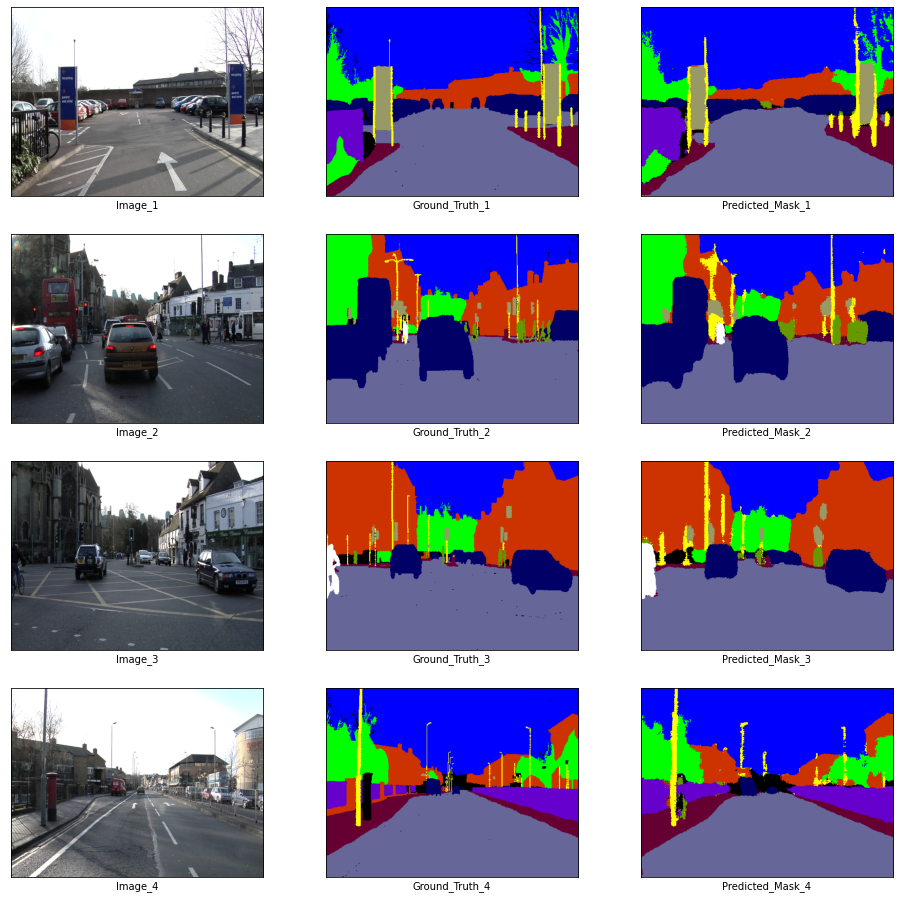

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 16



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36021136078569627
Training Time: 73.28758144378662 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.478485584259033
Epoch 17



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3664068778355916
Training Time: 72.0428614616394 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.0417001247406006
Epoch 18



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3451749367846383
Training Time: 68.75422048568726 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.8986793756484985
Epoch 19



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3440322172310617
Training Time: 73.05586862564087 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.134855270385742
Epoch 20



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3450882426566548
Training Time: 70.69370818138123 seconds


100%|██████████| 10/10 [00:18<00:00,  1.84s/it]


Validation Loss: -3.075718641281128


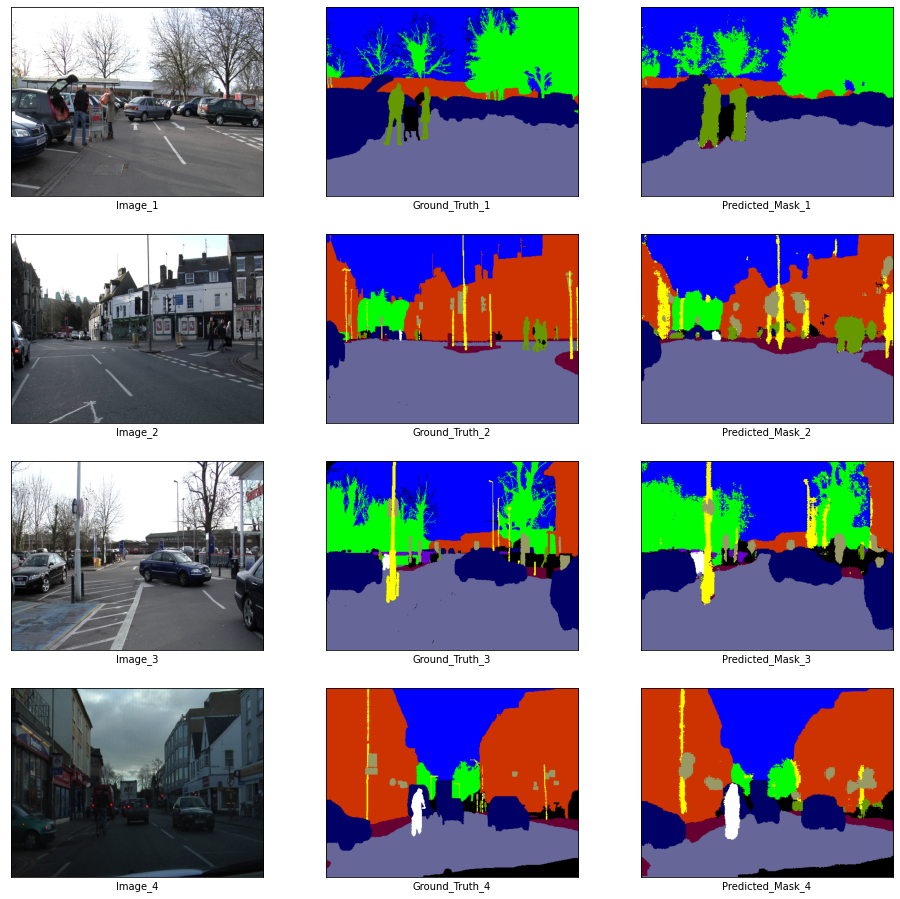

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 21



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3474910383423169
Training Time: 69.77076363563538 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.422074794769287
Epoch 22



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35025179717275834
Training Time: 71.95405411720276 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.1058316230773926
Epoch 23



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3276502076122496
Training Time: 71.29573845863342 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.5105831623077393
Epoch 24



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33401886622111004
Training Time: 70.78541040420532 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.890635371208191
Epoch 25



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3292495368255509
Training Time: 73.16670274734497 seconds


100%|██████████| 10/10 [00:17<00:00,  1.79s/it]


Validation Loss: -2.748560905456543


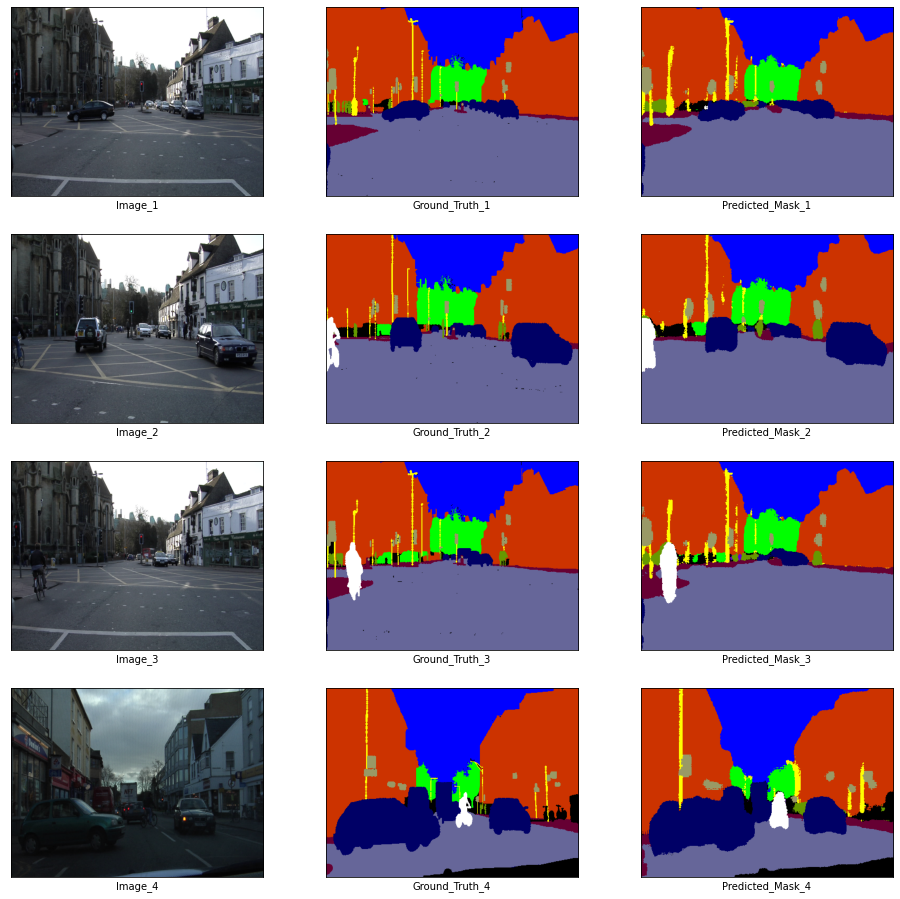

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 26



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34150759958558613
Training Time: 69.78299593925476 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.274392604827881
Epoch 27



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3204284252391921
Training Time: 72.25113725662231 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.056478500366211
Epoch 28



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33564646873209214
Training Time: 71.5493094921112 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.904518961906433
Epoch 29



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.32509062190850574
Training Time: 67.00560903549194 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.7657880783081055
Epoch 30



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3208379993836085
Training Time: 68.16572332382202 seconds


100%|██████████| 10/10 [00:17<00:00,  1.75s/it]


Validation Loss: -2.5307788848876953


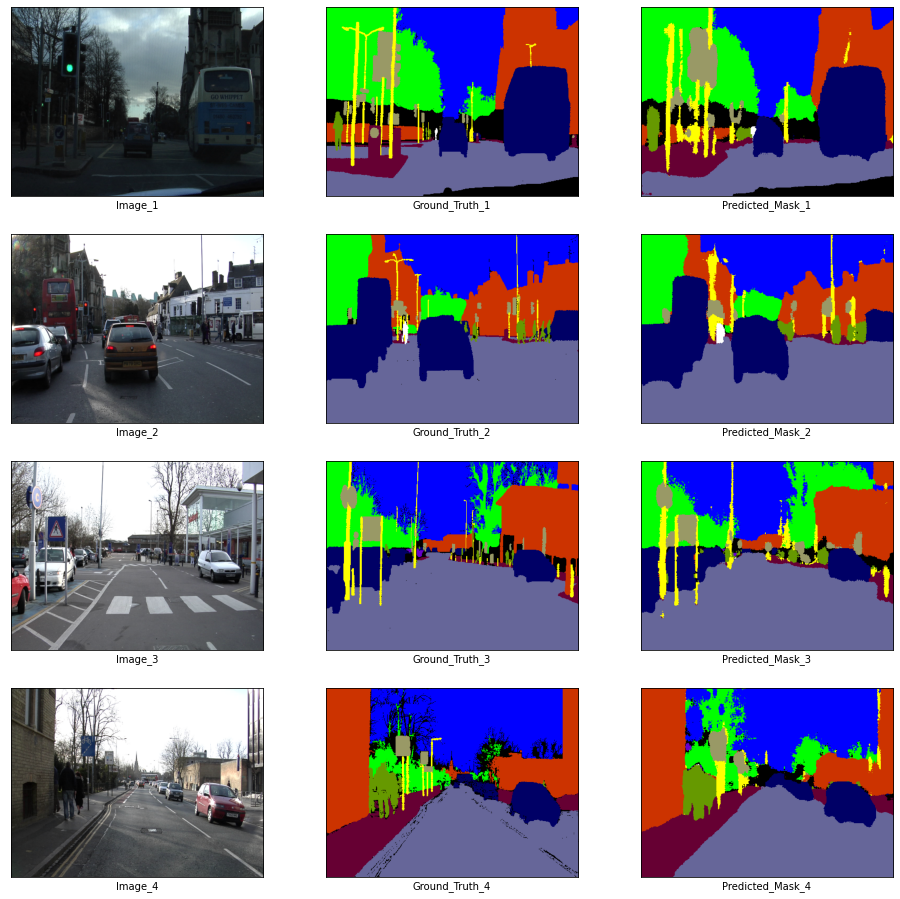

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 31



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.31969668881760704
Training Time: 71.82485032081604 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.361729145050049
Epoch 32



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.32309653609991074
Training Time: 74.29160785675049 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.032465934753418
Epoch 33



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.32033802486128277
Training Time: 75.48112368583679 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.4319894313812256
Epoch 34



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.32804613808790845
Training Time: 72.69714188575745 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.794719934463501
Epoch 35



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.31769441068172455
Training Time: 71.8673963546753 seconds


100%|██████████| 10/10 [00:17<00:00,  1.76s/it]


Validation Loss: -2.1656746864318848


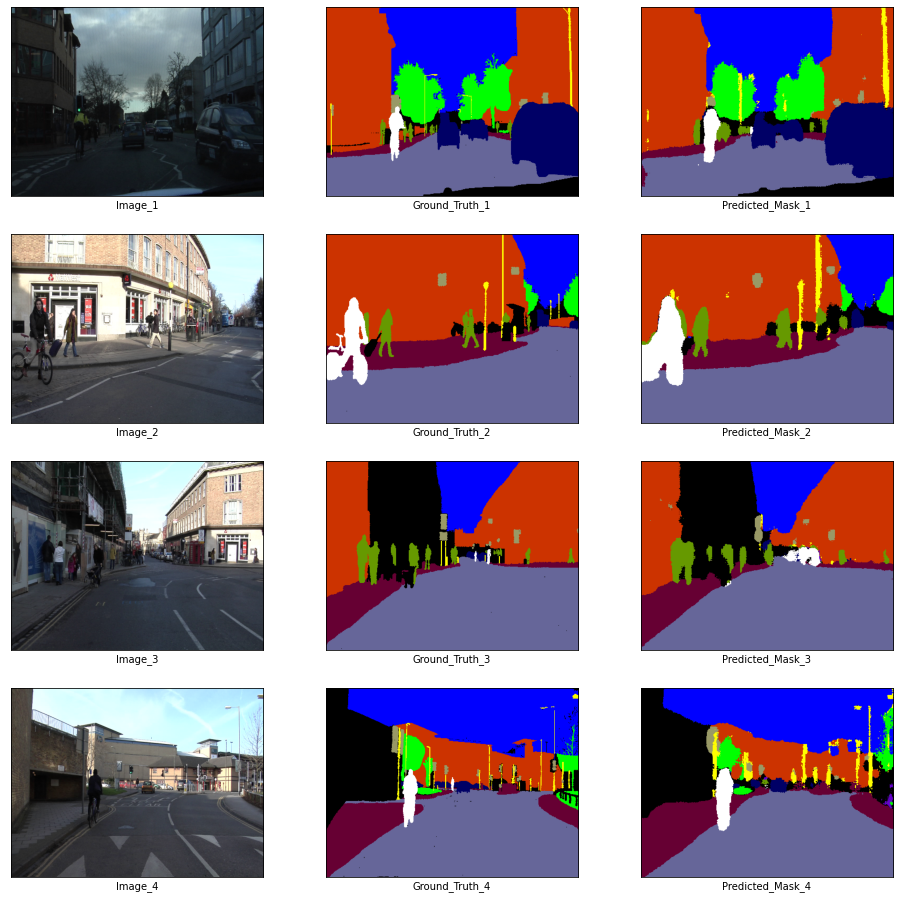

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 36



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3055818925301234
Training Time: 73.52490949630737 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.8640450239181519
Epoch 37



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3162262539068858
Training Time: 71.37170124053955 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.0492944717407227
Epoch 38



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2993227024045255
Training Time: 72.92915511131287 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.4777159690856934
Epoch 39



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3153013222747379
Training Time: 72.09029388427734 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5181312561035156
Epoch 40



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.293889375610484
Training Time: 69.66453742980957 seconds


100%|██████████| 10/10 [00:17<00:00,  1.77s/it]


Validation Loss: -2.3401412963867188


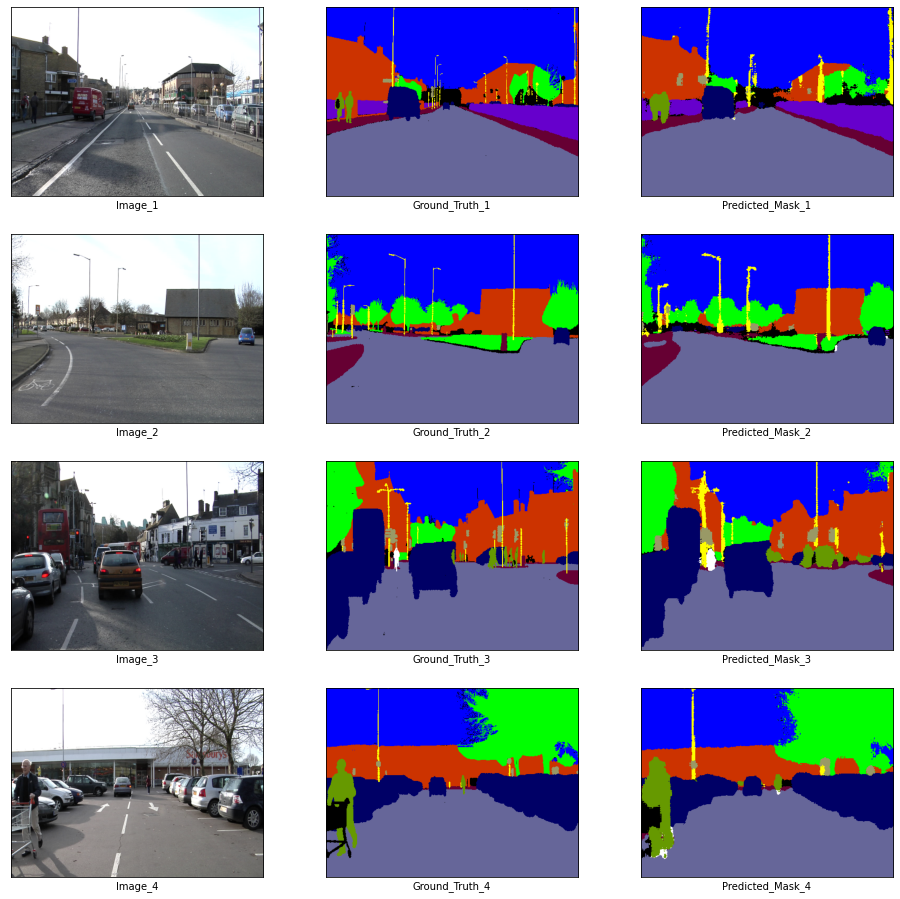

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 41



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.30231641771064865
Training Time: 74.8078625202179 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.808883547782898
Epoch 42



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3124642562535074
Training Time: 70.41031169891357 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.9900554418563843
Epoch 43



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.300084188580513
Training Time: 75.3329930305481 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.4131009578704834
Epoch 44



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.29749153926968575
Training Time: 73.88566970825195 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.4911680221557617
Epoch 45



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2919413641923004
Training Time: 75.55665421485901 seconds


100%|██████████| 10/10 [00:18<00:00,  1.86s/it]


Validation Loss: -2.8489484786987305


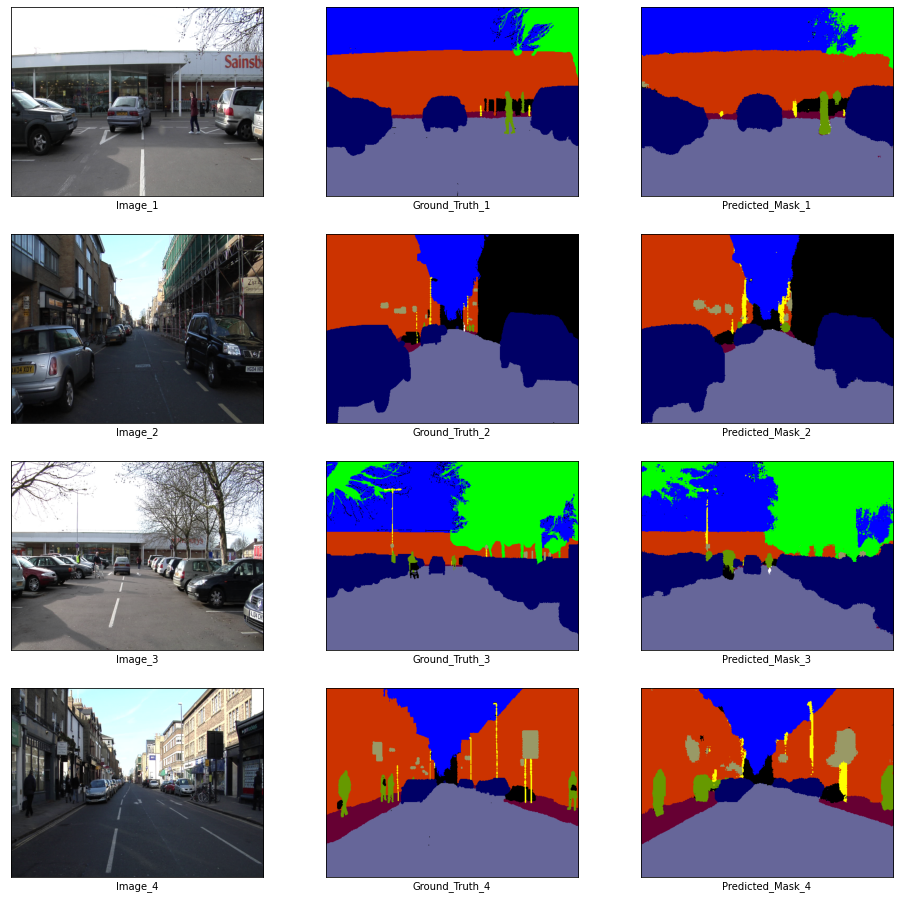

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 46



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2988526469303502
Training Time: 73.99589920043945 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.6355502605438232
Epoch 47



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.28511346007386845
Training Time: 73.9842278957367 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.355703592300415
Epoch 48



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2909007440838549
Training Time: 71.22921252250671 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.9158661365509033
Epoch 49



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.28161097276541924
Training Time: 80.40890264511108 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.096156120300293
Epoch 50



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2709875421391593
Training Time: 72.53480315208435 seconds


100%|██████████| 10/10 [00:18<00:00,  1.84s/it]


Validation Loss: -2.7580928802490234


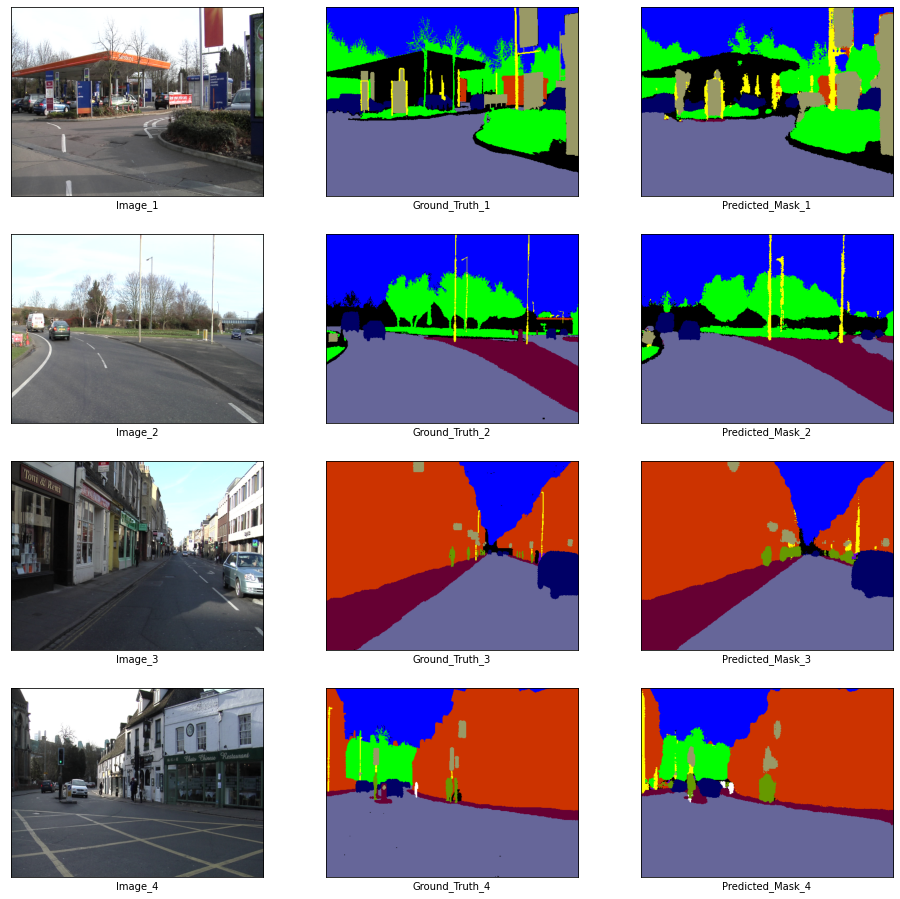

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 51



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.30309445907672244
Training Time: 72.95589590072632 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.2149691581726074
Epoch 52



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.28215064108371735
Training Time: 70.73221015930176 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.498643398284912
Epoch 53



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2739398707118299
Training Time: 73.11875367164612 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.6148550510406494
Epoch 54



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.29294291593962246
Training Time: 71.84650778770447 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.370117425918579
Epoch 55



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2808568928804662
Training Time: 75.33013367652893 seconds


100%|██████████| 10/10 [00:18<00:00,  1.81s/it]


Validation Loss: -2.6301956176757812


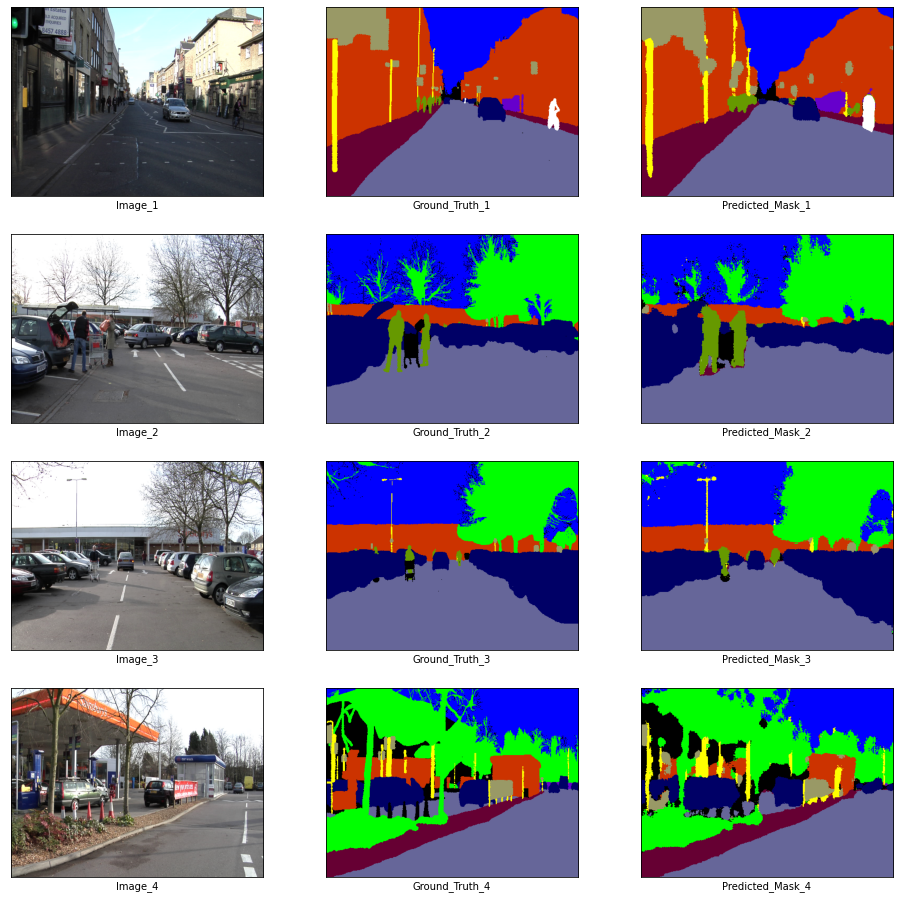

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 56



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2802722292641799
Training Time: 76.74905729293823 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.881911039352417
Epoch 57



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3081405924426185
Training Time: 80.48465657234192 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.237144708633423
Epoch 58



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2919013487795989
Training Time: 73.80911326408386 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.0475354194641113
Epoch 59



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.29986351024773383
Training Time: 79.25050091743469 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.710829257965088
Epoch 60



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.27425851052006084
Training Time: 75.63098740577698 seconds


100%|██████████| 10/10 [00:18<00:00,  1.80s/it]


Validation Loss: -1.8141961097717285


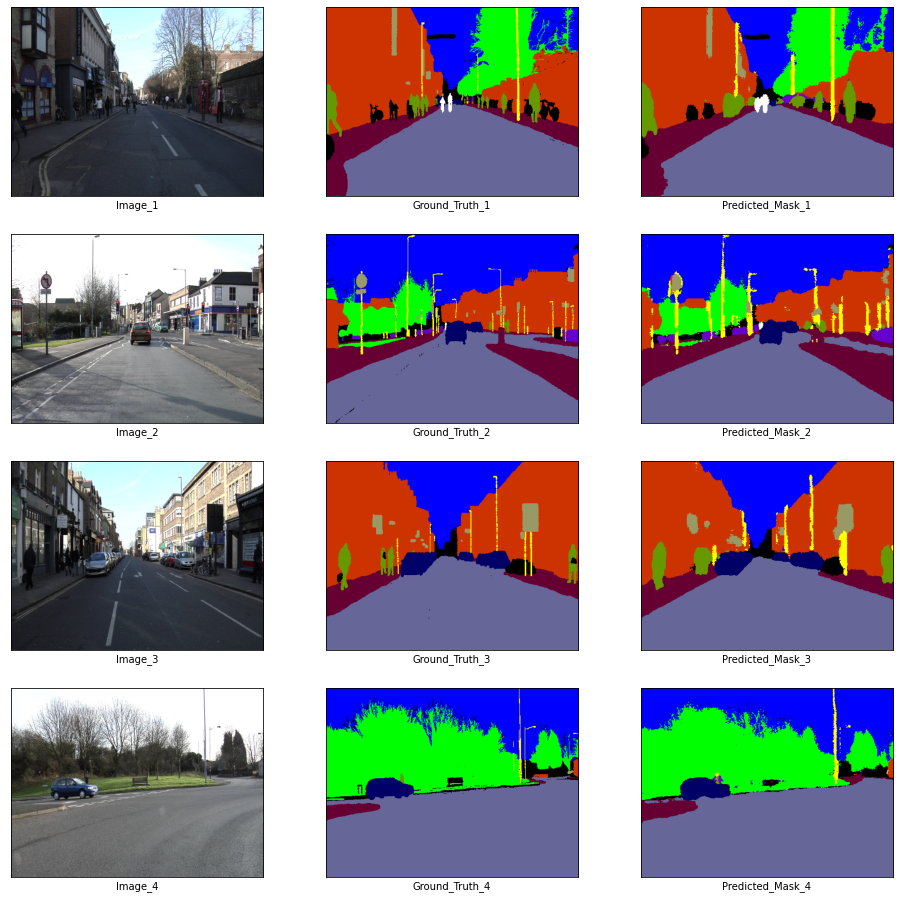

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 61



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.27895556141932804
Training Time: 74.40099024772644 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.1123936176300049
Epoch 62



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.26608619714776677
Training Time: 72.98433685302734 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.0077672004699707
Epoch 63



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.26716939691040253
Training Time: 74.2747597694397 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.3683435916900635
Epoch 64



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2755889267557197
Training Time: 72.8414945602417 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.513871669769287
Epoch 65



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.28952616163425976
Training Time: 73.77518367767334 seconds


100%|██████████| 10/10 [00:20<00:00,  2.01s/it]


Validation Loss: -1.7026195526123047


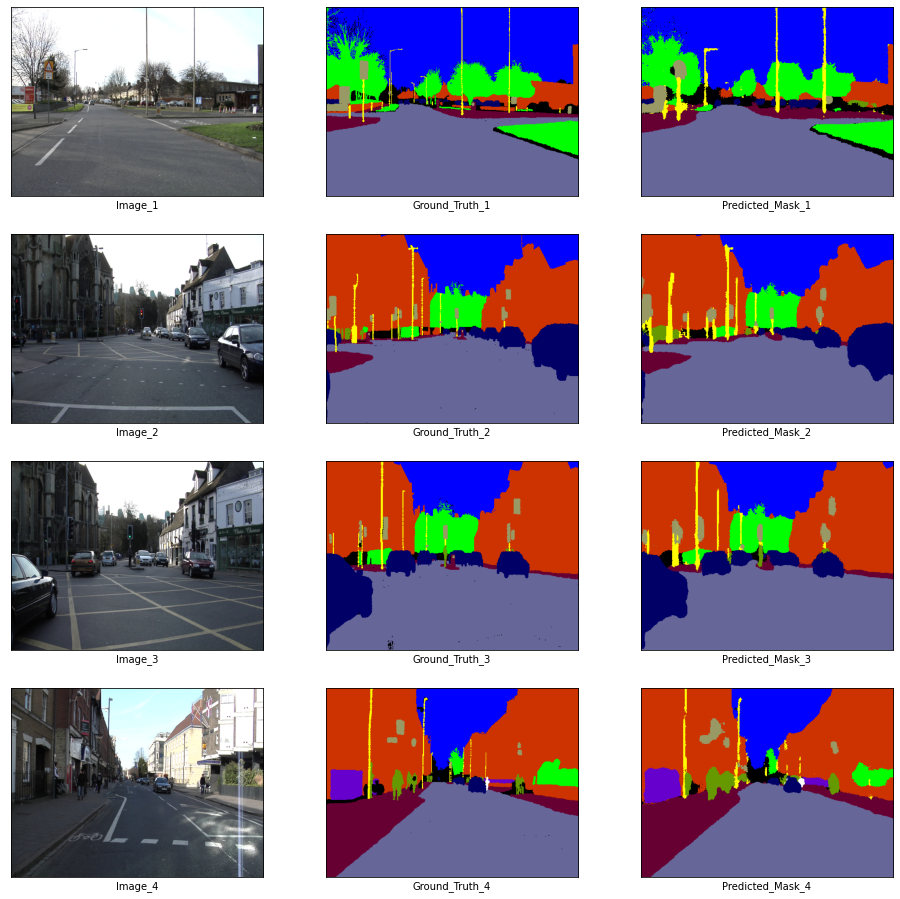

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 66



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.28495869661370915
Training Time: 75.81341791152954 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.426546812057495
Epoch 67



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2751305533779992
Training Time: 76.36941432952881 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.2525837421417236
Epoch 68



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2665194364057647
Training Time: 77.09186124801636 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.8285279273986816
Epoch 69



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.27290701245268184
Training Time: 75.26302552223206 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.000791549682617
Epoch 70



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2748342971834872
Training Time: 76.19665360450745 seconds


100%|██████████| 10/10 [00:21<00:00,  2.20s/it]


Validation Loss: -1.8784890174865723


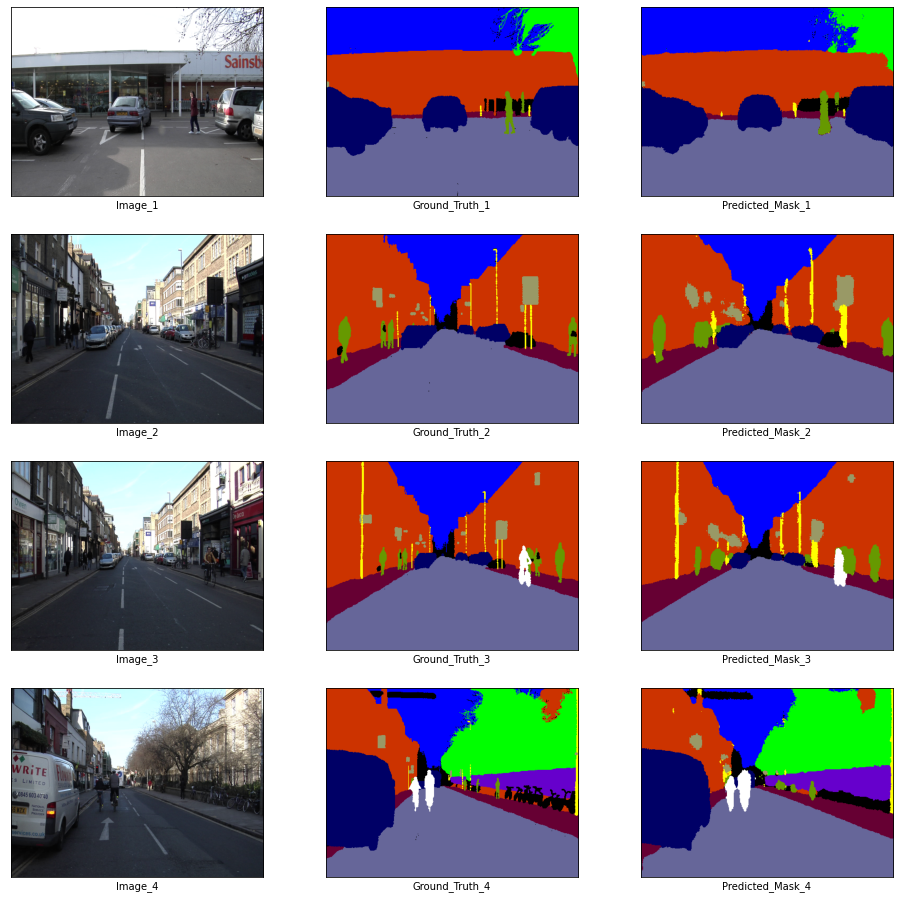

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 71



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25919409634338486
Training Time: 76.25516605377197 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.420161485671997
Epoch 72



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2636290755536821
Training Time: 81.09212517738342 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.8697099685668945
Epoch 73



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2742058564391401
Training Time: 78.31154584884644 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.7213704586029053
Epoch 74



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2798440083861351
Training Time: 80.33539724349976 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.2292943000793457
Epoch 75



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2577066545685132
Training Time: 77.25961899757385 seconds


100%|██████████| 10/10 [00:20<00:00,  2.00s/it]


Validation Loss: -1.9914125204086304


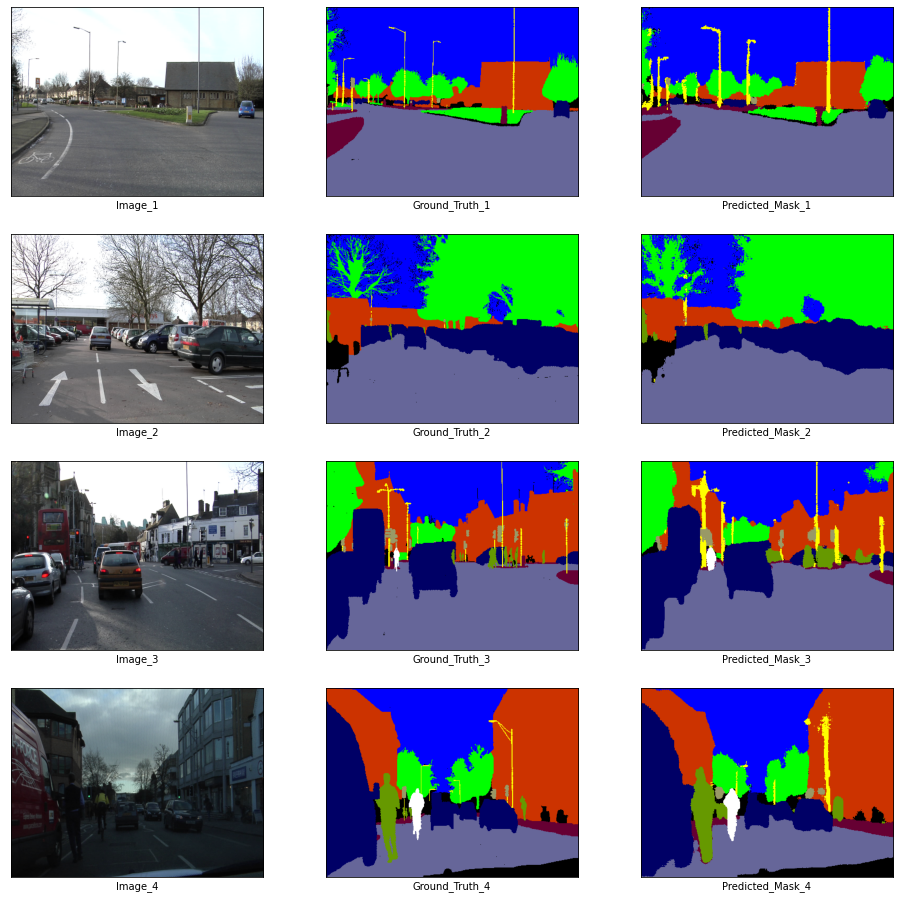

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 76



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2599371700651116
Training Time: 73.92774677276611 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.6357123851776123
Epoch 77



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2612792042394479
Training Time: 74.21235227584839 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.553557276725769
Epoch 78



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25584955265124637
Training Time: 76.57287240028381 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.3581106662750244
Epoch 79



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2803935292694304
Training Time: 75.53302788734436 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.0829343795776367
Epoch 80



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2636556352178256
Training Time: 76.70109987258911 seconds


100%|██████████| 10/10 [00:18<00:00,  1.88s/it]


Validation Loss: -2.344799518585205


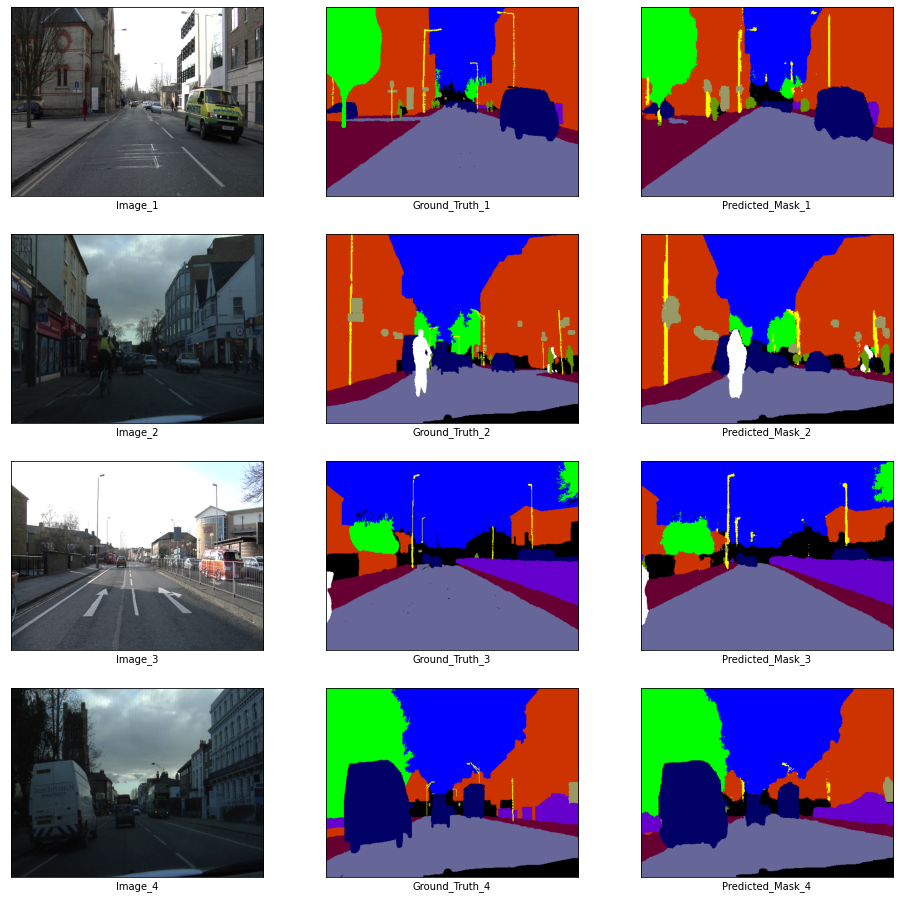

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 81



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25111547112464905
Training Time: 78.74307870864868 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.159451961517334
Epoch 82



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.258918681078487
Training Time: 78.77846312522888 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.4982378482818604
Epoch 83



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24599889376097256
Training Time: 76.4324562549591 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.3962793350219727
Epoch 84



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24954619300034311
Training Time: 83.66837215423584 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.1276609897613525
Epoch 85



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2473284618722068
Training Time: 77.52379322052002 seconds


100%|██████████| 10/10 [00:21<00:00,  2.13s/it]


Validation Loss: -3.1538333892822266


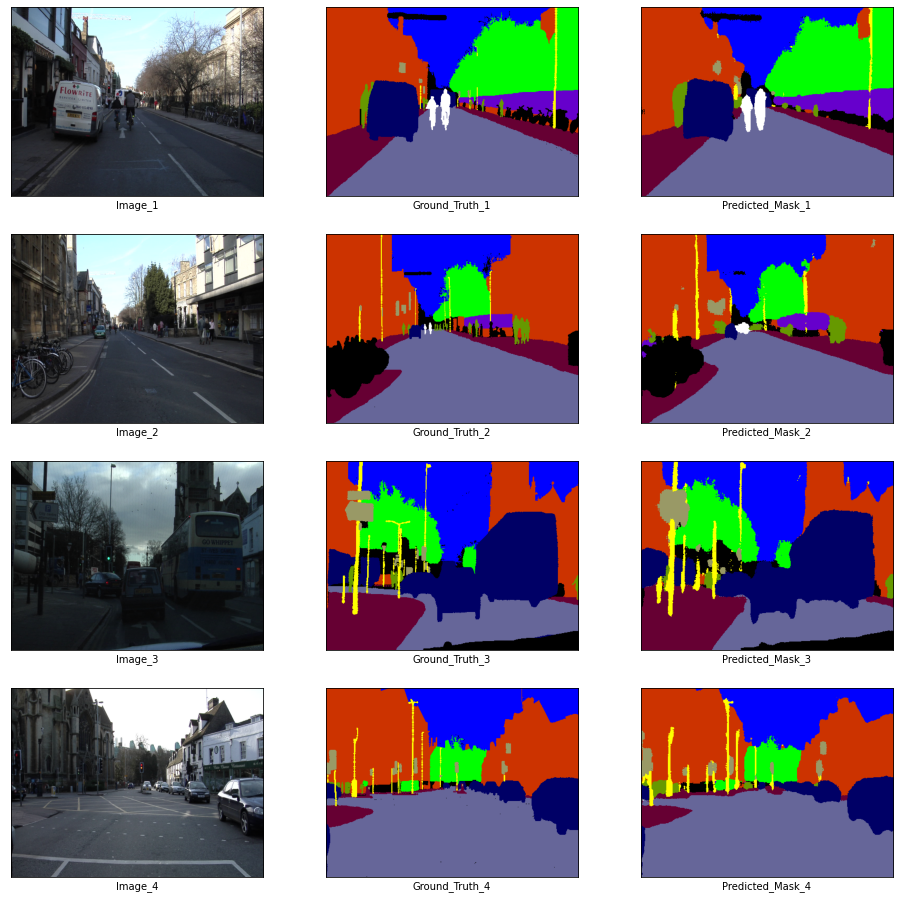

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 86



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24530789421664345
Training Time: 78.09324669837952 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.8146713972091675
Epoch 87



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25456496328115463
Training Time: 83.31163239479065 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.509093761444092
Epoch 88



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24910779007607037
Training Time: 81.68507981300354 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.5285701751708984
Epoch 89



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25791269458002514
Training Time: 86.09110403060913 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.951927661895752
Epoch 90



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2564264399309953
Training Time: 79.63863039016724 seconds


100%|██████████| 10/10 [00:20<00:00,  2.08s/it]


Validation Loss: -2.6189520359039307


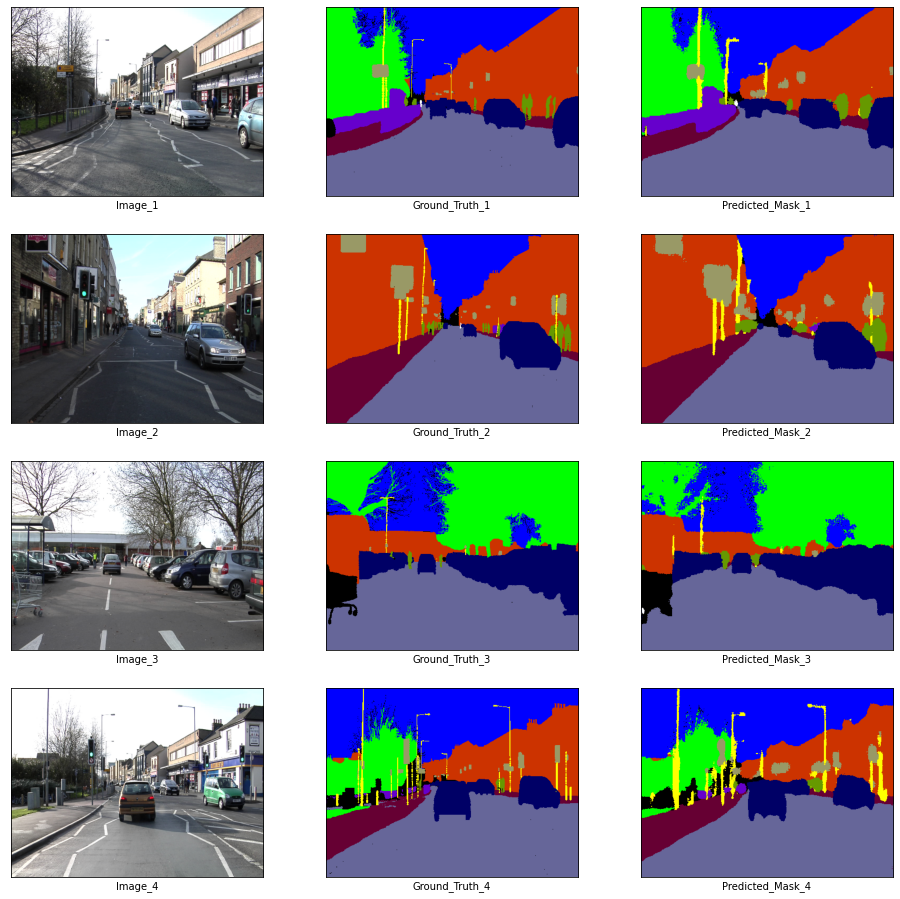

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 91



 19%|█▉        | 7/36 [00:15<01:06,  2.28s/it]Traceback (most recent call last):
  File "/usr/lib/python3.7/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.7/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/usr/lib/python3.7/shutil.py", line 498, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/usr/lib/python3.7/shutil.py", line 496, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-5klgmajp'
  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24788490227527088
Training Time: 78.38344621658325 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.532428741455078
Epoch 92



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24762644329004818
Training Time: 79.11894392967224 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.9391180276870728
Epoch 93



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25513726307286155
Training Time: 78.8469569683075 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.6975317001342773
Epoch 94



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2459701912270652
Training Time: 81.45460820198059 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.4334994554519653
Epoch 95



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25200552576118046
Training Time: 80.21743774414062 seconds


100%|██████████| 10/10 [00:19<00:00,  1.95s/it]


Validation Loss: -2.8273563385009766


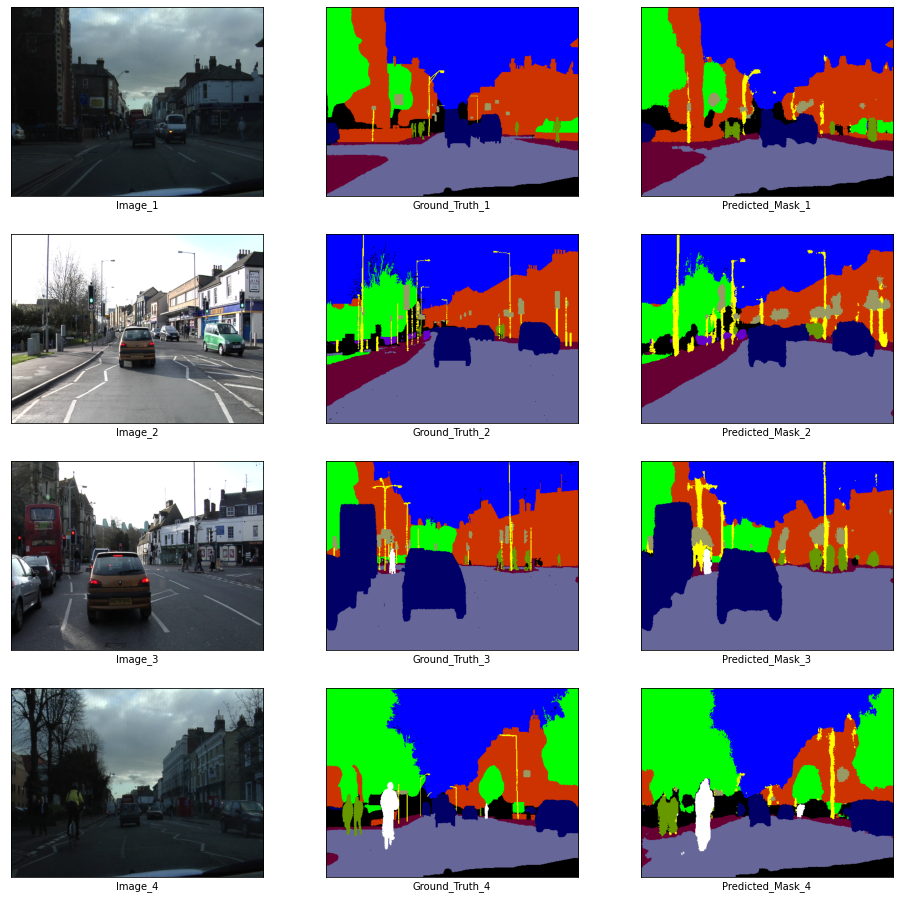

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 96



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.2491574933131536
Training Time: 78.7568109035492 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.5992510318756104
Epoch 97



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.25283442520433
Training Time: 79.76653099060059 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.019623279571533
Epoch 98



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.24313223155008423
Training Time: 81.12763047218323 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.915083408355713
Epoch 99



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.23145413191782105
Training Time: 85.55071949958801 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.8849235773086548
Epoch 100



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.23700948597656357
Training Time: 79.03745532035828 seconds


100%|██████████| 10/10 [00:19<00:00,  1.99s/it]


Validation Loss: -2.417924642562866


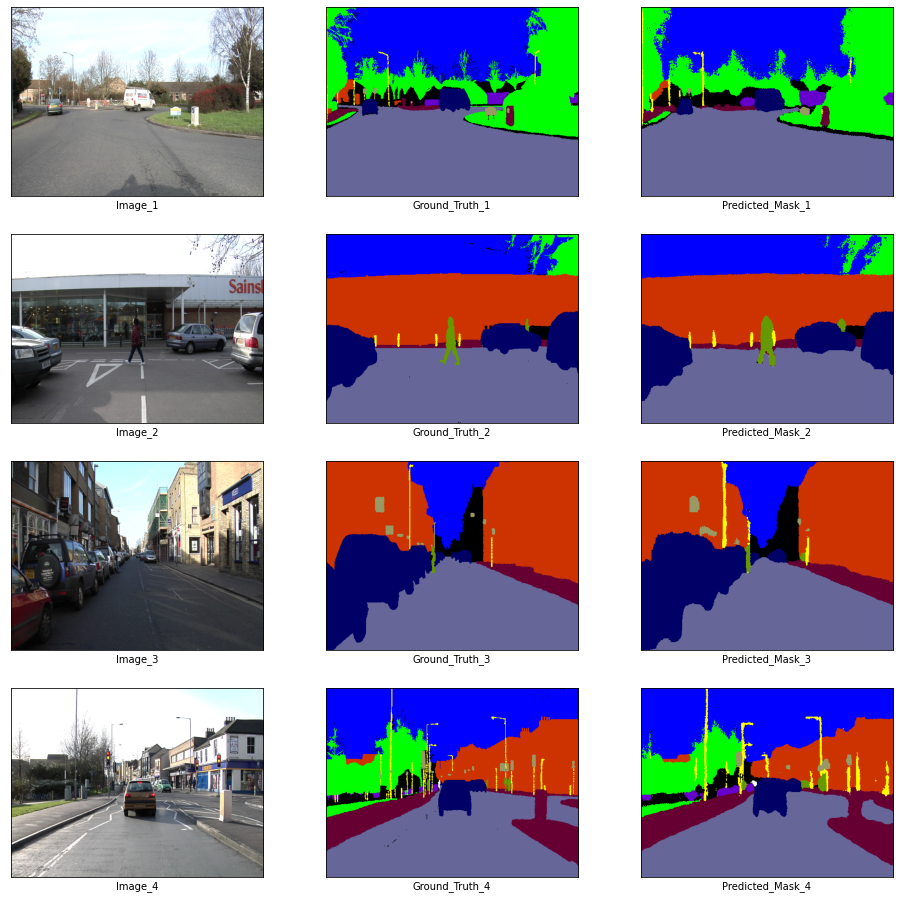

Checkpoint saved

Training Done.
Training Mean Loss: 0.302476
Validation Mean Loss: -2.445659


In [ ]:
train_loss_history, val_loss_history = train(
    enet, train_loader, val_loader,
    device, criterion, optimizer,
    len(train_images) // batch_size,
    len(val_images) // batch_size, 5,
    5, './checkpoints', 'enet', 100
)

Visualization of results


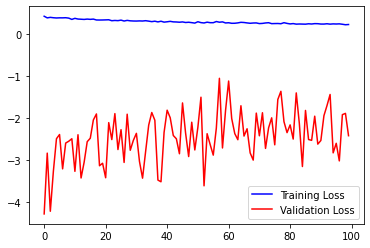

In [ ]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.plot(val_loss_history, color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

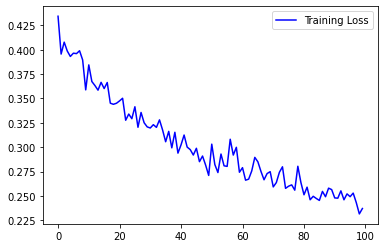

In [ ]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.legend()
plt.show()

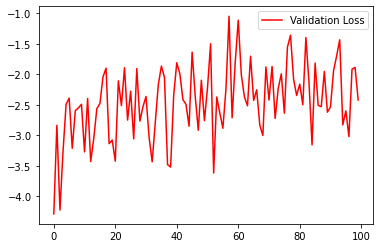

In [ ]:
plt.plot(val_loss_history, color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

## Prediction

In [ ]:
state_dict = torch.load('./checkpoints/enet-65-10.422941818833351--1.7026195526123047.pth')['state_dict']
enet.load_state_dict(state_dict)

<All keys matched successfully>

Prediction on Training Data

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


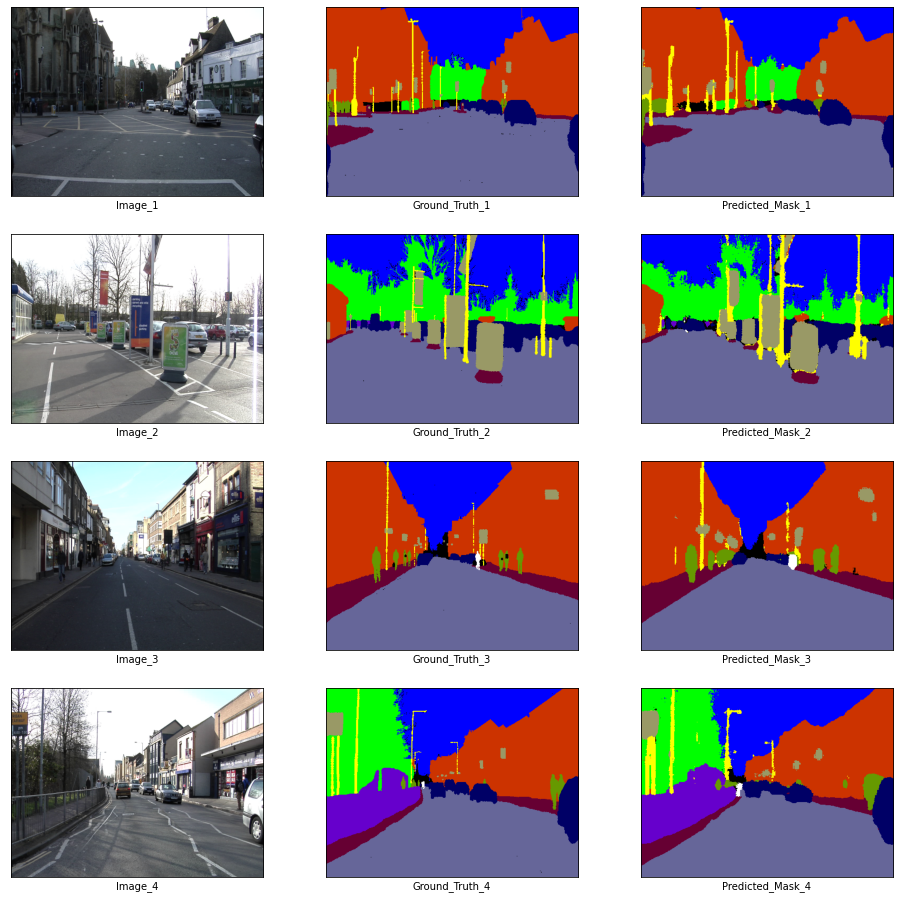

In [ ]:
x_batch, y_batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

Prediction on Validation Data

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


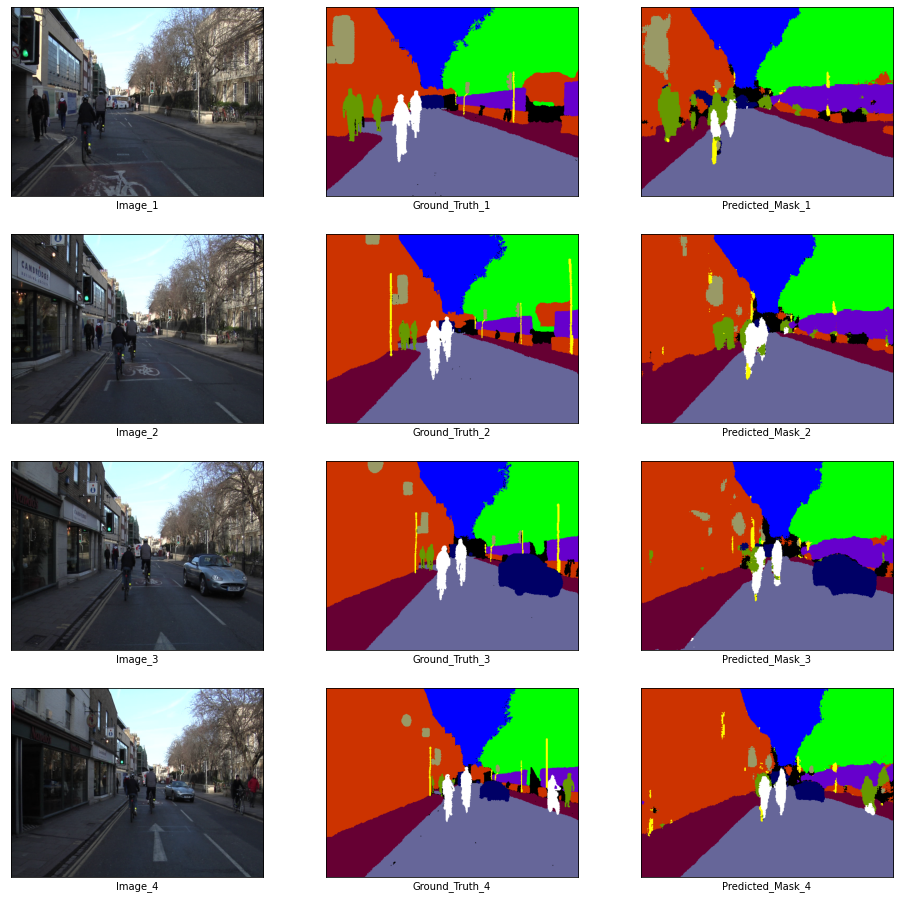

In [ ]:
x_batch, y_batch = next(iter(val_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

In [ ]:
state_dict = torch.load('./checkpoints/enet-70-9.894034698605537--1.8784890174865723.pth')['state_dict']
enet.load_state_dict(state_dict)

<All keys matched successfully>

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


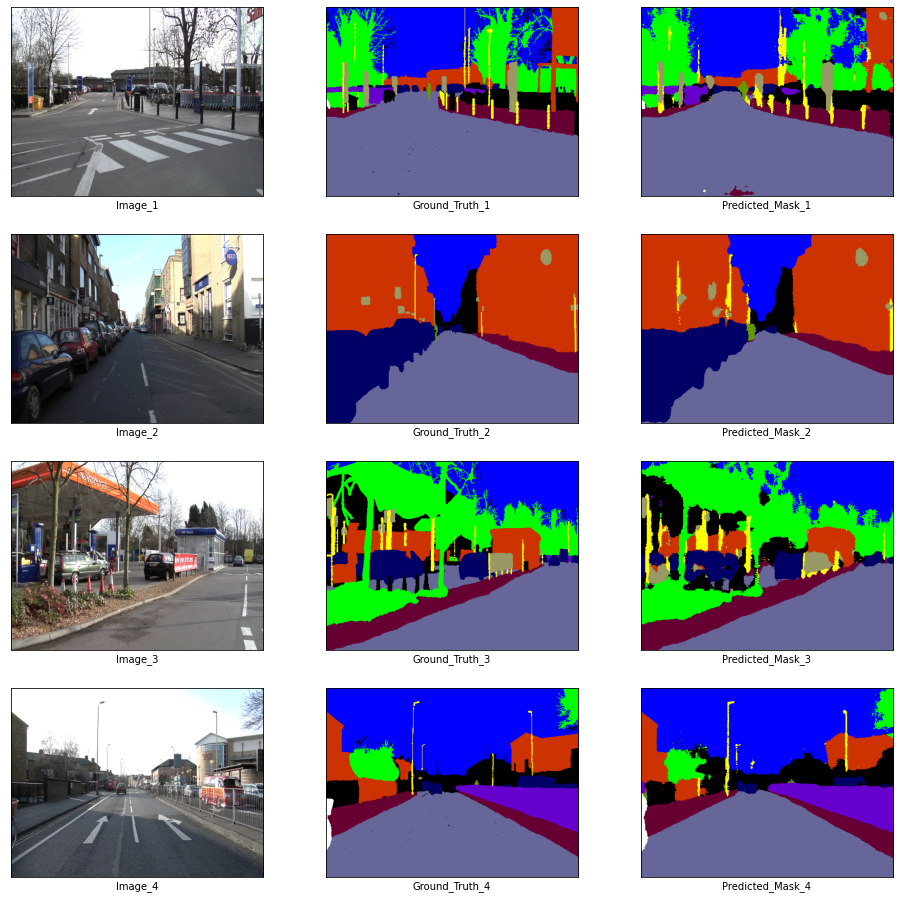

In [ ]:
x_batch, y_batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


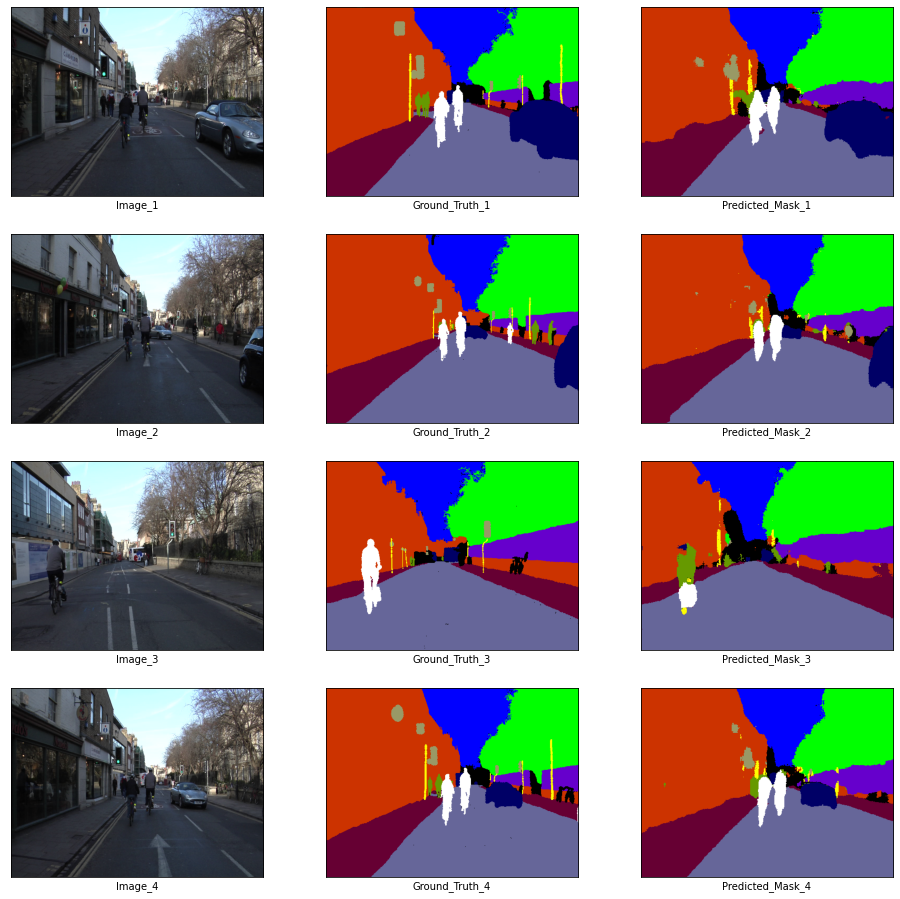

In [ ]:
x_batch, y_batch = next(iter(val_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()